In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial import cKDTree as KDTree
from tqdm import tqdm

## Load Data

In [2]:
import numpy as np
import h5py
from collections import OrderedDict

pixel_per_um = 15.3846 # from BioRxiv paper
um_per_pixel = 1.0 / pixel_per_um
f = h5py.File("../data/osmFISH/mRNA_coords_raw_counting.hdf5", 'r')
keys = list(f.keys())

pos_dic = OrderedDict()
genes = []

# Exclude bad quality data, according to the supplementary material of osmFISH paper
blacklists = ['Cnr1_Hybridization4', 'Plp1_Hybridization4', 'Vtn_Hybridization4',
              'Klk6_Hybridization5', 'Lum_Hybridization9', 'Tbr1_Hybridization11']

barcodes_df = pd.DataFrame({'Gene':[], 'Centroid_X':[], 'Centroid_Y':[]})
for k in keys:
    if k in blacklists:
        continue
    gene = k.split("_")[0]
    
    # Correct wrong gene labels
    if gene == 'Tmem6':
        gene = 'Tmem2'
    elif gene == 'Kcnip':
        gene = 'Kcnip2'
    
    points = np.array(f[k]) * um_per_pixel
    if gene in pos_dic:
        pos_dic[gene] = np.vstack((pos_dic[gene], points))
    else:
        pos_dic[gene] = points
        genes.append(gene)
    
    barcodes_df = barcodes_df.append(pd.DataFrame({'Gene':[gene]*points.shape[0], 'Centroid_X':points[:,0], 'Centroid_Y':points[:,1]}),ignore_index=True)
    
tagList_df = pd.DataFrame(sorted(genes),columns=['Gene'])
barcodes_df.reset_index(drop=True, inplace=True)

In [3]:
# Auxiliary function to build spatial gene expression graph
def buildGraph(barcodes_df, d_th):
    G = nx.Graph()
    node_removed = []
    barcodes_df.reset_index(drop=True, inplace=True)

    kdT = KDTree(np.array([barcodes_df.Centroid_X.values,barcodes_df.Centroid_Y.values]).T)
    res = kdT.query_pairs(d_th)
    res = [(x[0],x[1]) for x in list(res)]

    # Add nodes
    G.add_nodes_from((barcodes_df.index.values), test=False, val=False, label=0)
    # Add edges
    G.add_edges_from(res)

    # Remove connected components with less than N nodes, representing spurious gene expression
    N=3
    for component in tqdm(list(nx.connected_components(G))):
        if len(component)<N:
            for node in component:
                node_removed.append(node)
                G.remove_node(node)

    barcodes_df = barcodes_df[~barcodes_df.index.isin(node_removed)]
    barcodes_df.reset_index(drop=True, inplace=True)
    
    
    return G, barcodes_df

In [4]:
# Auxiliary function to compute maximum nearest neighbor distance d_th
def plotNeighbor(barcodes_df):
    barcodes_df.reset_index(drop=True, inplace=True)
    
    kdT = KDTree(np.array([barcodes_df.Centroid_X.values,barcodes_df.Centroid_Y.values]).T)
    d,i = kdT.query(np.array([barcodes_df.Centroid_X.values,barcodes_df.Centroid_Y.values]).T,k=2)
    plt.hist(d[:,1],bins=200);
    plt.axvline(x=np.percentile(d[:,1],97),c='r')
    print(np.percentile(d[:,1],97))
    d_th = np.percentile(d[:,1],97)
    
    return d_th

#### Estimate maximum nearest neighbor distance for connecting spots in spatial gene expression graph

1.6912512293147743


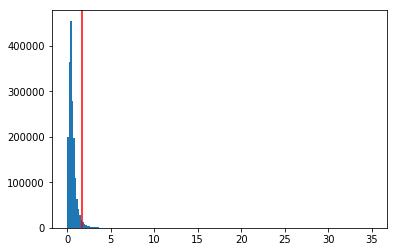

In [5]:
d_th = plotNeighbor(barcodes_df)

#### Generate spatial gene expression graph

In [6]:
G, barcodes_df = buildGraph(barcodes_df, d_th)

100%|██████████| 98675/98675 [00:00<00:00, 518072.31it/s]


In [7]:
# Number of nodes in the graph
print(G.number_of_nodes())

1714166


In [8]:
barcodes_df.shape

(1714166, 3)

## Load Embedding

In [9]:
X = np.load('../results/osmFISH/embedding_osmFISH.npy')

In [10]:
X.shape

(1714166, 50)

## Visualization of node embeddings

In [14]:
import umap

reducer = umap.UMAP(
    n_neighbors=10,
    n_components=3,
    n_epochs=500,
    init='spectral',
    min_dist=0.1,
    spread=1,
    random_state=42,
    verbose=True
)
embedding = reducer.fit_transform(X)

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
     learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=0.1, n_components=3, n_epochs=500,
     n_neighbors=10, negative_sample_rate=5, random_state=42,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Wed Jan  8 16:02:44 2020 Finding Nearest Neighbors
Wed Jan  8 16:02:44 2020 Building RP forest with 70 trees


/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))


Wed Jan  8 16:13:41 2020 NN descent for 21 iterations


/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for 

	 0  /  21
	 1  /  21
Wed Jan  8 16:16:05 2020 Finished Nearest Neighbor Search
Wed Jan  8 16:17:22 2020 Construct embedding


/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 125 separate connected components using meta-embedding (experimental)
  n_components


	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Wed Jan  8 21:17:57 2020 Finished embedding


In [15]:
# Save UMAP projection
np.save('../results/osmFISH/osmFISH_umap.npy', embedding)

In [10]:
# Load UMAP projection
embedding = np.load('../results/osmFISH/osmFISH_umap.npy')

In [11]:
Y_umap = embedding
Y_umap -= np.min(Y_umap, axis=0)
Y_umap /= np.max(Y_umap, axis=0)
Y_umap.shape

(1714166, 3)

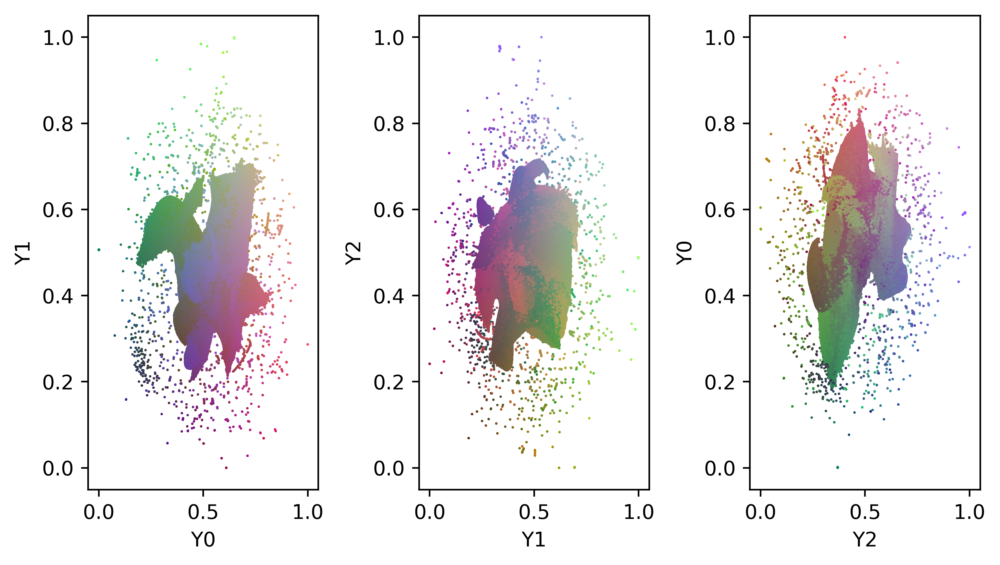

In [13]:
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(7,4),dpi=500)
cycled = [0,1,2,0]
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(Y_umap[:,cycled[i]], Y_umap[:,cycled[i+1]], c=Y_umap,  s=5, marker='.', linewidths=0, edgecolors=None)
    plt.xlabel("Y"+str(cycled[i]))
    plt.ylabel("Y"+str(cycled[i+1]))
plt.tight_layout()
# plt.savefig('../figures/SupFig4b.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

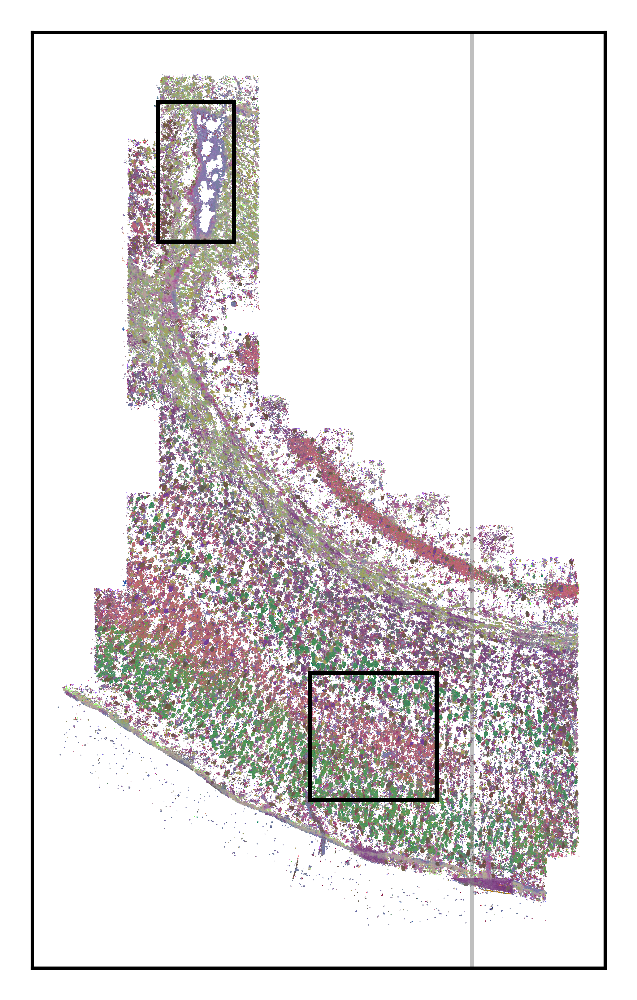

In [14]:
from matplotlib.patches import Rectangle
fig=plt.figure(figsize=(4,4),dpi=1000)
ax = fig.add_subplot(1, 1, 1)

px1 = 400
px2 = 1000
py1 = 2700
py2 = 500

width_cutoff = 1640 # um

plt.scatter(barcodes_df.Centroid_X, barcodes_df.Centroid_Y, c=Y_umap, s=0.1,marker='.',linewidths=0, edgecolors=None)

# Draw cut-out
roi1 = Rectangle((px1,py1),300,550,linewidth=1,edgecolor='black',facecolor='none')
ax.add_patch(roi1);

roi2 = Rectangle((px2,py2),500,500,linewidth=1,edgecolor='black',facecolor='none')
ax.add_patch(roi2);

plt.axvline(x=width_cutoff,linestyle = '-',linewidth=1, color='gray', alpha = 0.5)

plt.axis('scaled');
plt.xticks([])
plt.yticks([])
# plt.savefig('../figures/Fig3a.png', dpi=1000, bbox_inches='tight', pad_inches=0.0)

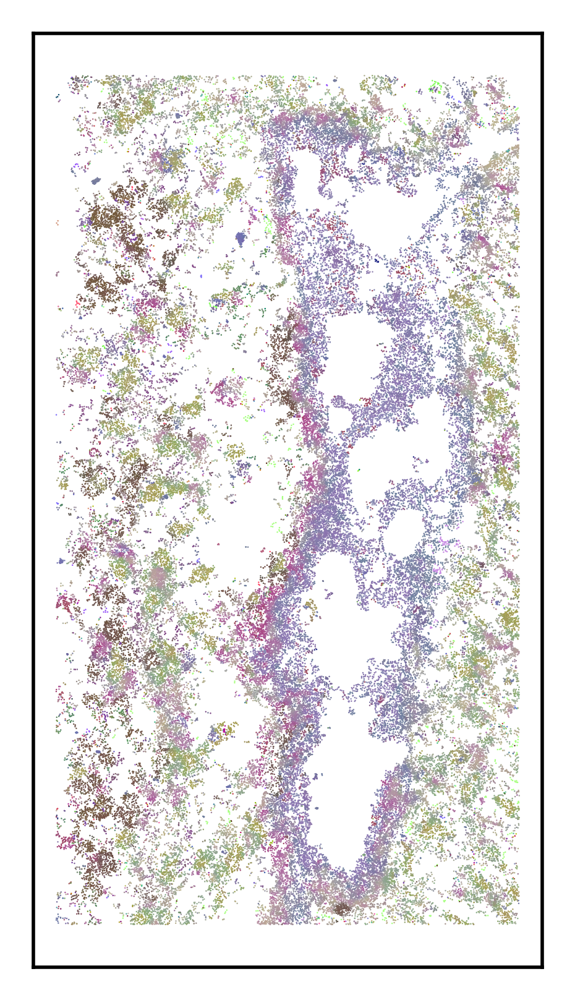

In [32]:
# Plot cut-out
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_df[(barcodes_df.Centroid_X>px1) & (barcodes_df.Centroid_X<px1+300) & (barcodes_df.Centroid_Y>py1) & (barcodes_df.Centroid_Y<py1+550)] 
Y_tmp = Y_umap
Y_tmp = Y_tmp[(barcodes_df.Centroid_X>px1) & (barcodes_df.Centroid_X<px1+300) & (barcodes_df.Centroid_Y>py1) & (barcodes_df.Centroid_Y<py1+550)]
plt.scatter(cut_out_df.Centroid_X, cut_out_df.Centroid_Y, c=Y_tmp, s=0.5,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig3d.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

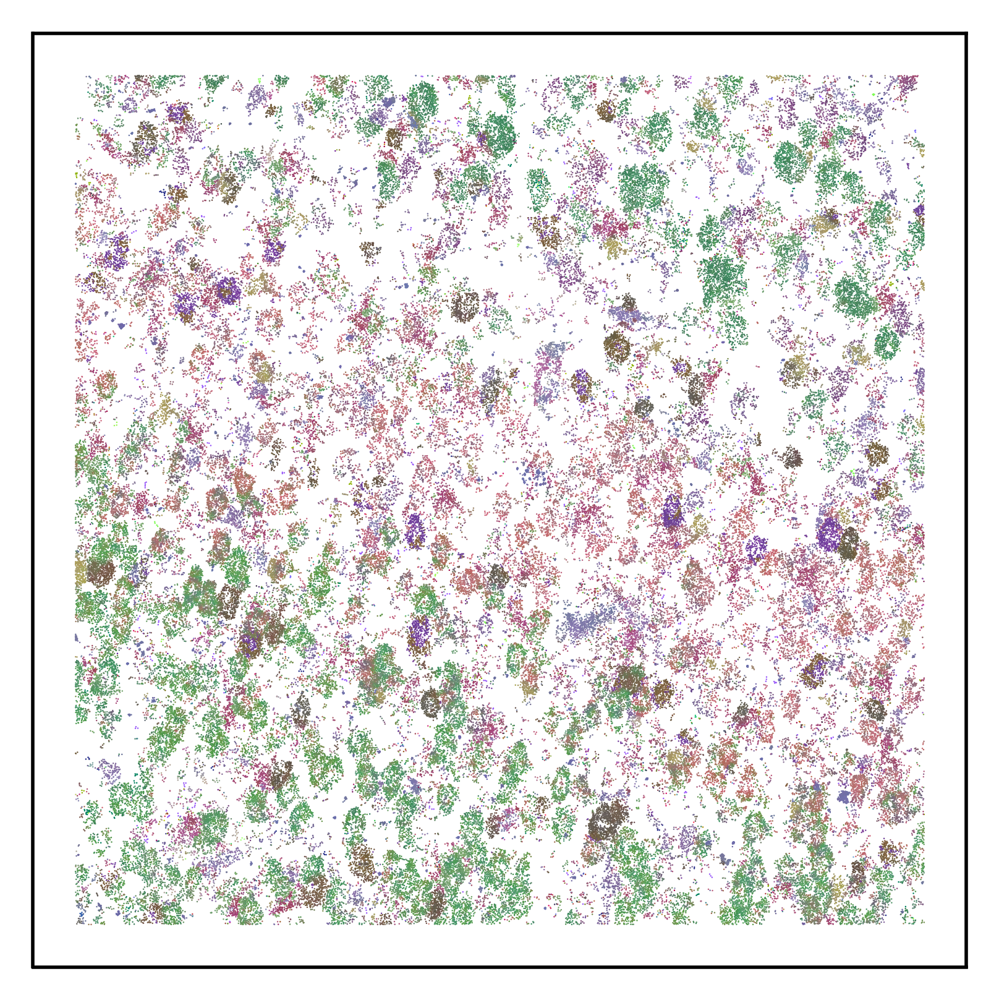

In [33]:
# Plot cut-out
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_df[(barcodes_df.Centroid_X>px2) & (barcodes_df.Centroid_X<px2+500) & (barcodes_df.Centroid_Y>py2) & (barcodes_df.Centroid_Y<py2+500)] 
Y_tmp = Y_umap
Y_tmp = Y_tmp[(barcodes_df.Centroid_X>px2) & (barcodes_df.Centroid_X<px2+500) & (barcodes_df.Centroid_Y>py2) & (barcodes_df.Centroid_Y<py2+500)]
plt.scatter(cut_out_df.Centroid_X, cut_out_df.Centroid_Y, c=Y_tmp, s=0.5,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig3e.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

In [12]:
# Annotate rgb color-space spot locations
from matplotlib.colors import to_hex
from tqdm.notebook import tqdm

barcodes_df['colorspace'] = [to_hex(Y_umap[x,:], keep_alpha=False) for x in tqdm(range(Y_umap.shape[0]))]

## Identification of distinct gene constellations and spatial domains

#### Clustering of the embedding space with Scanpy [1] implementation of Leiden clustering  algortihm

[1] ***Wolf, F. Alexander, Philipp Angerer, and Fabian J. Theis. "SCANPY: large-scale single-cell gene expression data analysis." Genome biology 19.1 (2018): 15.***

In [13]:
import scanpy as sc

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
results_file = '../results/osmFISH/osmFISH.h5'  # the file that will store the analysis results

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.24.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [25]:
adata = sc.AnnData(X=X)

In [26]:
# Compute the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=15)

computing neighbors
    using data matrix X directly


/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:11:40)


In [27]:
sc.tl.leiden(adata, random_state=42)

running Leiden clustering
    finished: found 274 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (3:45:57)


In [28]:
# save clustering data
adata.write(results_file)

In [29]:
adata.obs['Gene'] = barcodes_df.Gene.values

In [14]:
# Load clustering data
adata = sc.read(results_file)

In [15]:
# Add leiden clusters to spots dataframe
barcodes_df['cluster'] = adata.obs['leiden'].values
go_clusters = np.unique(adata.obs['leiden'].values)
barcodes_df.head()

,Gene,Centroid_X,Centroid_Y,colorspace,cluster
0,Acta2,1183.976184,1303.381303,#81869d,6
1,Acta2,1619.541620,1105.976106,#9a748b,36
2,Acta2,546.000546,2893.932894,#8580a2,33
3,Acta2,1473.356473,1508.521509,#716caa,9
4,Acta2,411.840412,2441.077441,#8f87a1,33


## Compare with Codeluppi et al. cell-type map
[2] ***Codeluppi, Simone, et al. "Spatial organization of the somatosensory cortex revealed by osmFISH." Nature methods 15.11 (2018): 932-935.***

In [16]:
# Auxiliary function for plotting heatmap
def heat_map(df, labels, sort=None, cluster_colors=None, 
             cluster_number = False, save=False, name='', fontsz=8):
    """
    Plot heat_map of a dataframe.
    Input:
    `df`(pandas dataframe): Dataframe to plot. Cells as columns, genes as rows.
    `labels`(list/array): list of labels of the cells in the same order as the 
        df columns.
    `sort`(list): List of sorted cluster numbers. If None it will plot them in
        assending order
    `cluster_colors`(dict): Dictionary matching cluster numbers with colors
        in the hex fomat. Like '#ff0000' for red
    `cluster_number`(bool): Show cluster numbers in the top color bar. Usefull
        when manually sorting the clusters.
    `save`(bool): option to save the figure as png with 300dpi.
    `name`(str): Name to use when saving
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('df used for plot: {}'.format(df_input_name))
    
    if sort == None:
        optimal_order = np.unique(labels)    
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    cl, lc = gen_labels(df, np.array(labels))[:2]
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = sum([lc[i] for i in optimal_order], [])
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = [cl[i] for i in optimal_sort_cells]
    
    fig, axHM = plt.subplots(figsize=(20,10))
    
    df_full = df.copy()
    z = df_full.values
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells]

    
    
    im = axHM.pcolormesh(z.values, cmap='viridis')
    
    plt.yticks(np.arange(0.5, len(df.index), 1), z.index, fontsize=fontsz)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    plt.xticks(np.arange(0.5,df.shape[1],step=1), labels=z.columns, rotation='vertical', fontsize=fontsz)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)
    
    counter = Counter(labels)
    pos=0
    if cluster_colors == None:
        optimal_sort_labels = np.array(optimal_sort_labels)
        axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='nipy_spectral')
        if cluster_number==True:
            for l in optimal_order:
                axLabel.text(pos + (counter[l]/2), 1.2, l, fontsize=fontsz,
                         horizontalalignment='center', verticalalignment='center')
                pos += Counter(labels)[l]
        
    else:
        for l in optimal_order:
            #Use Bottom instead of y for older versions of matplotlib
            axLabel.barh(y = 0, left = pos, width = counter[l], color=cluster_colors[l],
                        linewidth=0.5, edgecolor=cluster_colors[l])
            if cluster_number==True:
                axLabel.text(pos + (counter[l]/2), 0, l, fontsize=fontsz,
                         horizontalalignment='center', verticalalignment='center')
            pos += Counter(labels)[l]
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
#     if save == True:
#         plt.savefig('../figures/{}.svg'.format(name), dpi=500)

In [18]:
# Auxiliary functions for merging clusters
def post_merge(df, labels, post_merge_cutoff, linkage_method='single', 
               linkage_metric='correlation', fcluster_criterion='distance', name='', save=False):
    """
    Merge clusters based on likage and a cutoff. The mean expression levels of 
    the clusters are linked and them merged based on the cutoff provided.
    Input:
    `df`(Pandas dataframe): df with expression matrix. row-genes, col-cells.
    `labels`(list/array): Labels of the cells.
    `post_merge_cutoff`(float): Merge clusters that have a distance from each 
        other below the cutoff.
    `linkage_method`(string): Scipy linkage methods. Default = 'single'
    `linkage_metric`(string): Scipy lingae metric. Default = 'correlation'
    `fcluster_criterion`(string): Scipy fcluster criterion. Default = 'distance'

    Returns:
    `new_labels`(list): List of new cell labels after merging. 
    Additionally it plots the dendrogram showing which clusters are merged.

    """
    Z = scipy.cluster.hierarchy.linkage(df.T, method=linkage_method, metric=linkage_metric)
    merged_labels_short = scipy.cluster.hierarchy.fcluster(Z, post_merge_cutoff, criterion=fcluster_criterion)

    #Update labels  
    label_conversion = dict(zip(df.columns, merged_labels_short))
    label_conversion_r = dict(zip(merged_labels_short, df.columns))
    new_labels = [label_conversion[i] for i in labels] 

    #Plot the dendrogram to visualize the merging
    fig, ax = plt.subplots(figsize=(20,10))
    scipy.cluster.hierarchy.dendrogram(Z, labels=df.columns ,color_threshold=post_merge_cutoff)
    ax.hlines(post_merge_cutoff, 0, ax.get_xlim()[1])
    ax.set_title('Merged clusters')
    ax.set_ylabel(linkage_metric, fontsize=20)
    ax.set_xlabel('pre-merge cluster labels', fontsize=20)
    ax.tick_params(labelsize=10)
    
#     if save == True:
#         fig.savefig('../figures/{}.svg'.format(name), dpi=500)

    return new_labels

def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to 
    get the names of colums and rows)
    `model`(obj OR array): Clustering object. OR numpy array with cell labels.
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a

#### Load osmFISH cell-type data

In [19]:
import loompy
osmFISH_cells = loompy.connect('../data/osmFISH/osmFISH_SScortex_mouse_all_cells.loom')

In [20]:
df_osmfish = pd.DataFrame(data=osmFISH_cells[:,:].T, index=osmFISH_cells.ca['CellID'], columns=osmFISH_cells.ra['Gene']).astype(int)
df_osmfish.head()

,Gad2,Slc32a1,Crhbp,Cnr1,Vip,Cpne5,Pthlh,Crh,Tbr1,Lamp5,...,Ctps,Anln,Mrc1,Hexb,Ttr,Foxj1,Vtn,Flt1,Apln,Acta2
778,35,41,0,7,3,17,0,2,27,8,...,15,6,4,16,4,3,2,0,4,3
1409,16,26,1,0,1,2,1,0,10,25,...,4,7,11,1,5,1,2,0,21,3
3642,95,49,5,1,2,1,1,3,8,0,...,5,3,1,3,1,1,2,0,4,1
1302,21,16,0,2,2,0,0,0,3,24,...,3,6,0,3,3,2,0,0,2,0
1285,41,39,0,2,3,0,1,1,14,23,...,6,8,6,1,3,1,1,0,6,3


In [21]:
# Add cell coordinates
df_osmfish['X'] = osmFISH_cells.ca['X'] * um_per_pixel
df_osmfish['Y'] = osmFISH_cells.ca['Y'] * um_per_pixel
df_osmfish.head()

,Gad2,Slc32a1,Crhbp,Cnr1,Vip,Cpne5,Pthlh,Crh,Tbr1,Lamp5,...,Mrc1,Hexb,Ttr,Foxj1,Vtn,Flt1,Apln,Acta2,X,Y
778,35,41,0,7,3,17,0,2,27,8,...,4,16,4,3,2,0,4,3,1181.131192,1598.403291
1409,16,26,1,0,1,2,1,0,10,25,...,11,1,5,1,2,0,21,3,1289.476548,419.649824
3642,95,49,5,1,2,1,1,3,8,0,...,1,3,1,1,2,0,4,1,731.083923,2380.750388
1302,21,16,0,2,2,0,0,0,3,24,...,0,3,3,2,0,0,2,0,1251.461286,480.333011
1285,41,39,0,2,3,0,1,1,14,23,...,6,1,3,1,1,0,6,3,1274.815560,701.556138


In [22]:
# Create cluster gene expression matrix
hm = barcodes_df.groupby(['Gene','cluster']).size().unstack(fill_value=0)
hm.shape

(33, 274)

#### Merge smaller cluster based on correlation distance

In [23]:
# Z-score normalization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hm = pd.DataFrame(scaler.fit_transform(hm.values), columns=hm.columns, index=hm.index)
hm.head()

cluster,0,1,2,3,4,5,6,7,8,9,...,264,265,266,267,268,269,270,271,272,273
Gene,,,,,,,,,,,,,,,,,,,,,
Acta2,-0.391950,-0.371677,-0.119868,-0.381663,-0.395159,-0.321818,-0.587815,-0.417593,-0.402576,-0.411843,...,-0.209274,-0.209274,-0.176777,-0.176777,-0.240192,-0.215967,-0.176777,-0.176777,-0.176777,-0.176777
Aldoc,0.239680,0.163085,1.473844,0.241093,0.735007,0.627852,0.642112,0.431682,0.356696,-0.353694,...,0.941733,5.545762,-0.176777,5.656854,5.044037,1.209416,5.656854,-0.176777,5.656854,5.656854
Anln,0.270666,0.224402,-0.006894,-0.366894,-0.381849,-0.306996,1.078842,-0.363033,-0.110469,0.707534,...,-0.209274,-0.209274,-0.176777,-0.176777,-0.240192,-0.215967,-0.176777,-0.176777,-0.176777,-0.176777
Apln,-0.339036,-0.368693,-0.127916,-0.367441,-0.385102,-0.336111,0.141642,-0.405926,-0.365976,0.444246,...,-0.209274,-0.209274,-0.176777,-0.176777,-0.240192,-0.215967,-0.176777,-0.176777,-0.176777,-0.176777
Bmp4,-0.082571,0.018745,-0.396578,-0.382483,-0.391905,-0.339816,0.254956,-0.419651,-0.405338,0.189035,...,-0.209274,-0.209274,-0.176777,-0.176777,-0.240192,-0.215967,-0.176777,-0.176777,-0.176777,-0.176777


In [24]:
# Reindex cluster gene expression matrix
gene_sort = ['Gad2', 'Slc32a1', 'Crhbp', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh', 'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 'Kcnip2', 'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2', 'Ctps', 'Anln', 'Mrc1', 'Hexb', 'Ttr', 'Foxj1', 'Vtn', 'Flt1', 'Apln', 'Acta2']
hm = hm.reindex(gene_sort)

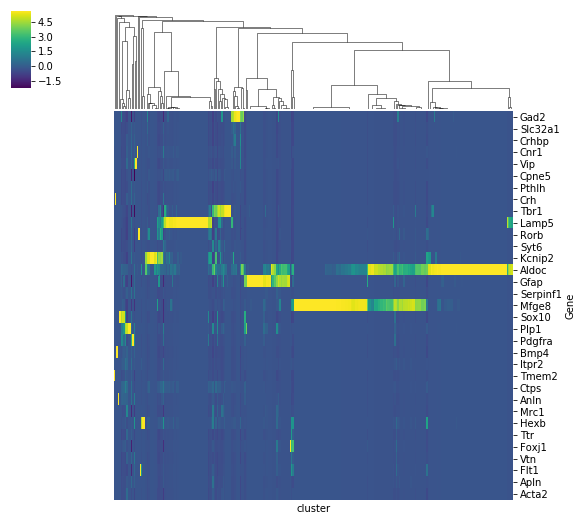

In [32]:
# Plot hierarchical clustering based on correlation
import seaborn as sns
g = sns.clustermap(hm, row_cluster=False, metric='correlation', method='average', cmap='viridis', figsize=(9,9), xticklabels=False, yticklabels=True)
# g.savefig("../figures/SupFig5.svg", dpi=500, bbox_inches='tight', pad_inches=0.0)

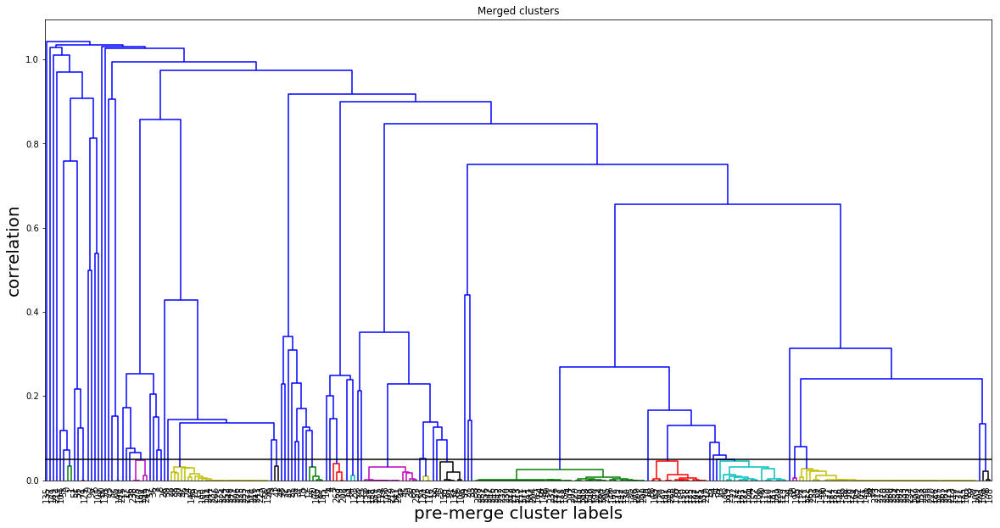

In [33]:
# Merge high correlated clusters
import scipy
hm_merge = post_merge(hm, hm.columns, 0.05, linkage_metric='correlation', linkage_method='average', name='SupFig5Dend', save=True)

In [33]:
# Macroclusters
np.unique(hm_merge)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69], dtype=int32)

In [34]:
# Create cluster gene expression matrix
hm = barcodes_df.groupby(['Gene','cluster']).size().unstack(fill_value=0)
hm.head()

cluster,0,1,2,3,4,5,6,7,8,9,...,264,265,266,267,268,269,270,271,272,273
Gene,,,,,,,,,,,,,,,,,,,,,
Acta2,121,257,1024,8,33,133,1006,22,43,914,...,0,0,0,0,0,0,0,0,0,0
Aldoc,2771,2228,6173,2285,3854,3721,1527,2497,2242,950,...,1,5,0,6,4,1,5,0,5,5
Anln,2901,2454,1389,62,78,189,1712,181,889,1607,...,0,0,0,0,0,0,0,0,0,0
Apln,343,268,998,60,67,79,1315,56,149,1444,...,0,0,0,0,0,0,0,0,0,0
Bmp4,1419,1696,130,5,44,65,1363,16,35,1286,...,0,0,0,0,0,0,0,0,0,0


In [35]:
# Compute new cluster gene expression matrix based on macro clusters from merging results
hm_macro = pd.DataFrame(np.zeros((hm.shape[0], np.unique(hm_merge).shape[0])), index=hm.index, columns=np.unique(hm_merge))

for d in np.unique(hm_merge):
    hm_macro.loc[:,d] = hm.iloc[:,np.where(np.array(hm_merge)==d)[0]].sum(axis=1)

In [36]:
# Z-score normalization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hm_macro = pd.DataFrame(scaler.fit_transform(hm_macro.values), columns=hm_macro.columns, index=hm_macro.index)
hm_macro.head()

,1,2,3,4,5,6,7,8,9,10,...,60,61,62,63,64,65,66,67,68,69
Gene,,,,,,,,,,,,,,,,,,,,,
Acta2,-0.385630,-0.420185,-0.176777,-0.176777,0.465019,-0.354517,-0.411843,-0.176777,-0.587815,-0.176777,...,-0.370451,-0.309252,-0.251129,-0.182620,-0.245747,-0.245950,-0.518644,-0.176777,-0.179275,-0.18811
Aldoc,0.205544,0.444781,-0.176777,-0.176777,0.082132,0.183999,-0.353694,-0.176777,0.642112,-0.176777,...,3.088313,3.137721,5.167826,5.656063,4.859729,2.797683,3.930066,-0.176777,-0.098784,-0.18811
Anln,0.251088,0.225511,-0.176777,-0.176777,0.199125,0.244206,0.707534,-0.176777,1.078842,-0.176777,...,-0.357628,-0.352382,-0.251129,-0.182620,-0.245747,-0.245950,-0.380934,-0.176777,-0.179275,-0.18811
Apln,-0.355822,-0.478334,-0.176777,-0.176777,-0.088041,-0.402460,0.444246,-0.176777,0.141642,-0.176777,...,-0.232998,-0.339616,-0.251129,-0.180579,-0.245747,-0.245950,-0.299685,-0.176777,-0.179275,-0.18811
Bmp4,-0.035480,-0.295407,-0.176777,-0.176777,0.209761,-0.055713,0.189035,-0.176777,0.254956,-0.176777,...,-0.376462,-0.363424,-0.251129,-0.182620,-0.245747,-0.245950,-0.523464,-0.176777,-0.179275,-0.18811


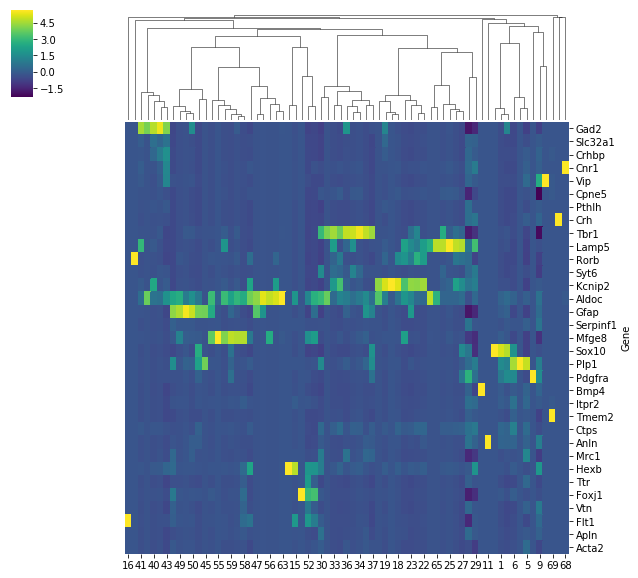

In [37]:
# Plot hierarchical clustering based on correlation
hm_macro = hm_macro.reindex(gene_sort)
sns.clustermap(hm_macro, row_cluster=False, metric='correlation', method='average', cmap='viridis')

In [38]:
# Annotate spots with macro cluster labels
hm_merge = np.array(hm_merge)
for macro_go in np.unique(hm_merge):
    barcodes_df.loc[barcodes_df.cluster.astype(int).isin(np.where(np.isin(hm_merge,[macro_go]))[0]),'macro_cluster'] = macro_go

In [39]:
# Load osmFISH cell-type maps
import pickle
 
with open("../data/osmFISH/polyT_seg.pkl", "rb") as f:
    seg_dic = pickle.load(f)
    
import loompy
osmfish_loom = loompy.connect('../data/osmFISH/osmFISH_SScortex_mouse_all_cells.loom')


import numpy as np
import h5py
from collections import OrderedDict

pixel_per_um = 15.3846 # from BioRxiv paper
um_per_pixel = 1.0 / pixel_per_um
f = h5py.File("../data/osmFISH/mRNA_coords_raw_counting.hdf5", 'r')
keys = list(f.keys())

pos_dic = OrderedDict()
genes = []

# Exclude bad quality data, according to the supplementary material of osmFISH paper
blacklists = ['Cnr1_Hybridization4', 'Plp1_Hybridization4', 'Vtn_Hybridization4',
              'Klk6_Hybridization5', 'Lum_Hybridization9', 'Tbr1_Hybridization11']

for k in keys:
    if k in blacklists:
        continue
    gene = k.split("_")[0]
    
    # Correct wrong gene labels
    if gene == 'Tmem6':
        gene = 'Tmem2'
    elif gene == 'Kcnip':
        gene = 'Kcnip2'
    
    points = np.array(f[k]) * um_per_pixel
    if gene in pos_dic:
        pos_dic[gene] = np.vstack((pos_dic[gene], points))
    else:
        pos_dic[gene] = points
        genes.append(gene)
genes = sorted(genes)

In [40]:
width, height = 2080, 3380 # um
all_genes = list(pos_dic.keys())
mrna_loci = [pos_dic[gene] for gene in all_genes]

In [41]:
osmfish_ref_colors = {
    "Inhibitory CP": "#9b067d",
    "Inhibitory Crhbp": "#9805cc",
    "Inhibitory Cnr1": "#ca4479",
    "Inhibitory IC": "#ff49b0",
    "Inhibitory Kcnip2": "#af7efe",
    "Inhibitory Pthlh": "#4e14a6",
    "Inhibitory Vip": "#7759a4",
    "Pyramidal Cpne5": "#3e4198",
    "Pyramidal L2-3": "#0ab4e4",
    "Pyramidal L2-3 L5": "#1e6a87",
    "Pyramidal Kcnip2": "#6787d6",
    "Pyramidal L3-4": "#004dba",
    "pyramidal L4": "#78edff",
    "Pyramidal L5": "#0a9fb4",
    "Pyramidal L6": "#027fd0",
    "Hippocampus": "#004b71",
    "Astrocyte Gfap": "#de4726",
    "Astrocyte Mfge8": "#f69149",
    "Oligodendrocyte Precursor cells": "#b3ee3d",
    "Oligodendrocyte COP": "#5dd73d",
    "Oligodendrocyte NF": "#64a44e",
    "Oligodendrocyte MF": "#2f7449",
    "Oligodendrocyte Mature": "#285528",
    "Perivascular Macrophages": "#762a14",
    "Microglia": "#a7623d",
    "C. Plexus": "#21b183",
    "Ependymal": "#fadf0b",
    "Pericytes": "#f8c495",
    "Endothelial": "#f81919",
    "Endothelial 1": "#f05556",
    "Vascular Smooth Muscle": "#aec470",
}

osmfish_ct = {
    18:"Inhib. CP",
    17:"Inhib. Crhbp",
    14:"Inhib. Cnr1",
    19:"Inhib. IC",
    15:"Inhib. Kcnip2",
    16:"Inhib. Pthlh",
    20:"Inhib. Vip",
    9:"Py. Cpne5",
    8:"Py. L2-3",
    10:"Py. L2-3 L5",
    6:"Py. Kcnip2",
    5:"Py. L3-4",
    4:"py. L4",
    12:"Py. L5",
    1:"Py. L6",
    13:"Hippocampus",
    3:"Astro. Gfap",
    2:"Astro. Mfge8",
    32:"Oligo. Precursor cells",
    33:"Oligo. COP",
    30:"Oligo. NF",
    22:"Oligo. MF",
    21:"Oligo. Mature",
    28:"PVM",
    29:"Microglia",
    24:"C. Plexus",
    27:"Ependymal",
    31:"Pericytes",
    7:"Endothelial",
    26:"Endothelial 1",
    25:"VSM"
}


In [42]:
seg_clusternames = list(np.unique(osmfish_loom.col_attrs["ClusterName"]))
col_dic = dict(zip(osmfish_loom.col_attrs['CellID'], [osmfish_ref_colors.get(e, None) for e in osmfish_loom.col_attrs["ClusterName"]]))
clid_dic = dict(zip(osmfish_loom.col_attrs['CellID'], [e for e in osmfish_loom.col_attrs["ClusterID"]]))

In [43]:
cluster_colors = {
    18 : '#9b067d',
    17 : '#9805cc',
    14 : '#ca4479',
    19 : '#ff49b0',
    15 : '#af7efe',
    16 : '#4e14a6',
    20 : '#7759a4',
     9 : '#3e4198',
     8 : '#0ab4e4',
    10 : '#1e6a87',
     6 : '#6787d6',
     5 : '#004dba',
     4 : '#78edff',
     1 : '#027fd0',
    13 : '#004b71',
    12 : '#0a9fb4',
     3 : '#de4726',
     2 : '#f69149',
    32 : '#b3ee3d',
    33 : '#5dd73d',
    30 : '#64a44e',
    22 : '#2f7449',
    21 : '#285528',
    28 : '#762a14',
    29 : '#a7623d',
    24 : '#21b183',
    27 : '#fadf0b',
    31 : '#f8c495',
     7 : '#f81919',
    26 : '#f05556',
    25 : '#aec470',
    11: '#6c6b6b',
    23: '#6c6b6b',
}

cluster_sort = [18,17,14,19,15,16,20, #Inhibitory
                9,8,10,6,5,4,12,1,13, #Excitatory
                3,2, #Astrocytes
                32,33,30,22,21, #Oligodendrocytes
                28,29, #Immune
                24,27, #Ventricle
                31,7,26,25] #Blood

In [44]:
from matplotlib.colors import to_rgba

width_cutoff = 1640 # um

seg_img = np.zeros([width_cutoff, height, 4])
seg_img[..., 3] = 1 # background color to black
seg_ctmap = np.zeros([width_cutoff, height], dtype=int) -1
for cell_id, seg_coords in seg_dic.items():
    if col_dic[cell_id] is None: # Remove 'Excluded' cluster
        continue
    seg_coords_small = (seg_coords / pixel_per_um).astype(int)
    seg_col = to_rgba(col_dic[cell_id])
    seg_ctmap[seg_coords_small[:, 0], seg_coords_small[:, 1]] = clid_dic[cell_id]
    seg_img[seg_coords_small[:, 0], seg_coords_small[:, 1]] = seg_col

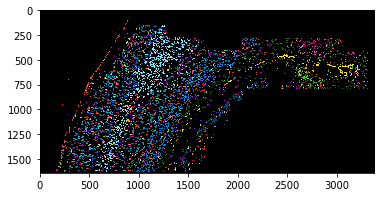

In [45]:
plt.imshow(seg_img)

In [46]:
# Generate heatmap of expression profiles of the corresponding spage2vec and cell-type clusters
ct_clusters = np.unique(seg_ctmap[seg_ctmap!=-1])
macro_go_clusters = np.unique(hm_merge)
ct_dict = dict(zip(ct_clusters, np.arange(ct_clusters.shape[0])))

dots_in_cells = np.zeros((macro_go_clusters.shape[0], ct_clusters.shape[0]))
cells_in_dots = np.zeros((macro_go_clusters.shape[0], ct_clusters.shape[0]))

barcodes_df = barcodes_df[barcodes_df.Centroid_X<=width_cutoff]

# Compute number of dots of each cell types with a given spage2vec cluster label
for go_idx, go in tqdm(enumerate(macro_go_clusters)):
    barcodes_df_tmp = barcodes_df.loc[barcodes_df.macro_cluster==go,'Centroid_X':'Centroid_Y'].values.astype(int)
    ct_tmp = seg_ctmap[barcodes_df_tmp[:,0],barcodes_df_tmp[:,1]]
    ct, ct_counts = np.unique(ct_tmp[ct_tmp!=-1], return_counts=True)
    
    
    
    ct_idx = [ct_dict[x] for x in ct]
    dots_in_cells[go_idx, ct_idx] = ct_counts

# Create dataframes
dots_in_cells = pd.DataFrame(dots_in_cells, columns=ct_clusters, index=macro_go_clusters)

In [47]:
# Annotate spots with cell-type labels from osmFISH
barcodes_df["osmFISH_ct"] = seg_ctmap[barcodes_df.Centroid_X.values.astype(int),barcodes_df.Centroid_Y.values.astype(int)]

In [63]:
# Remove spots without cell-type annotation (filter spots assgined to background -1)
barcodes_assigned = barcodes_df[barcodes_df.osmFISH_ct!=-1].copy()

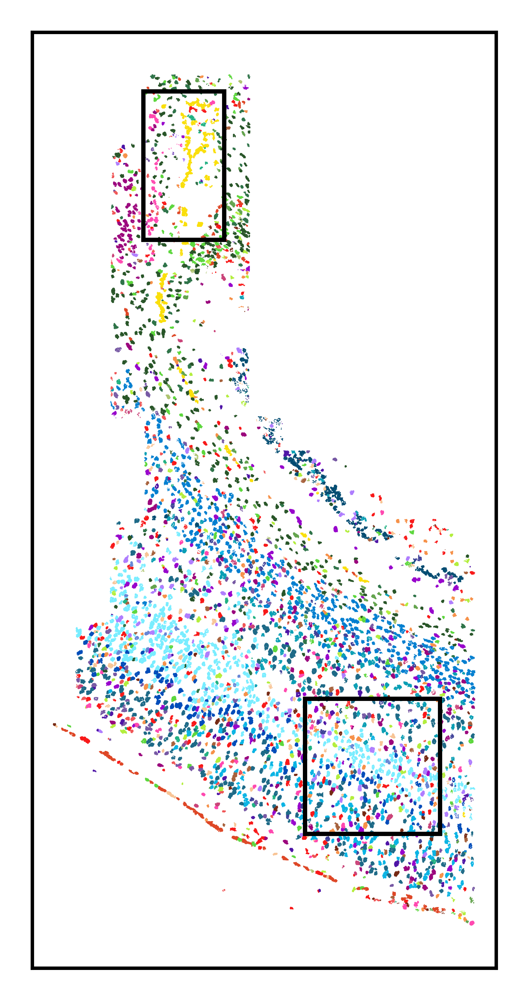

In [64]:
# Plot Cell-type map from pciSeq
fig=plt.figure(figsize=(4,4),dpi=1000)
ax = fig.add_subplot(1, 1, 1)

px1 = 400
px2 = 1000
py1 = 2700
py2 = 500

plt.scatter(barcodes_assigned.Centroid_X, barcodes_assigned.Centroid_Y, c=[cluster_colors[ct] for ct in barcodes_assigned.osmFISH_ct.values],  s=0.1,marker='.',linewidths=0, edgecolors=None)

# Draw cut-out
roi1 = Rectangle((px1,py1),300,550,linewidth=1,edgecolor='black',facecolor='none')
ax.add_patch(roi1);

roi2 = Rectangle((px2,py2),500,500,linewidth=1,edgecolor='black',facecolor='none')
ax.add_patch(roi2);

plt.xticks([])
plt.yticks([])
plt.axis('scaled');
# plt.savefig('../figures/Fig3b.png', dpi=1000, bbox_inches='tight', pad_inches=0.0)

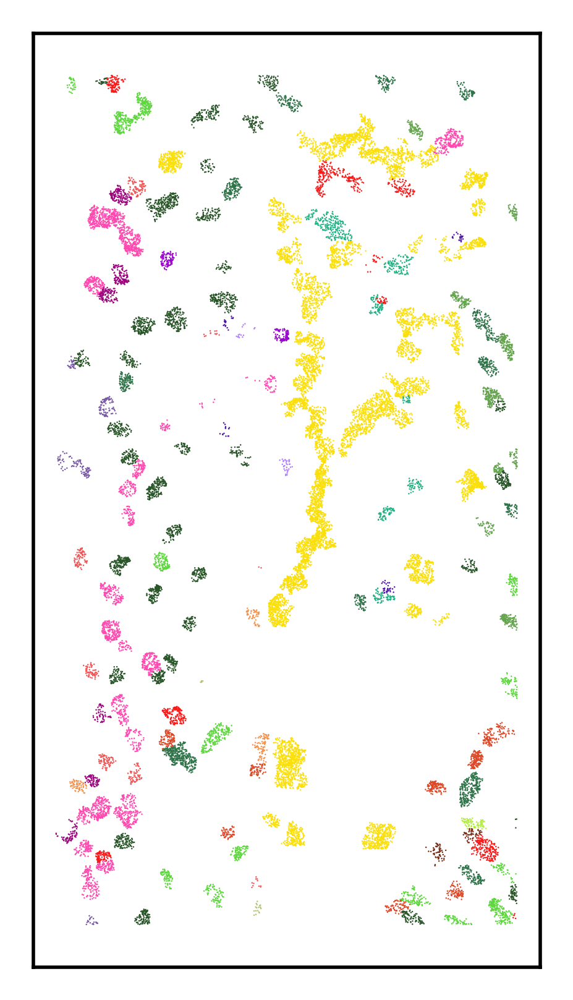

In [66]:
# Plot cut-out
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_assigned[(barcodes_assigned.Centroid_X>px1) & (barcodes_assigned.Centroid_X<px1+300) & (barcodes_assigned.Centroid_Y>py1) & (barcodes_assigned.Centroid_Y<py1+550)] 

plt.scatter(cut_out_df.Centroid_X, cut_out_df.Centroid_Y, c=[cluster_colors[ct] for ct in cut_out_df.osmFISH_ct.values], s=0.5,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig3f.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

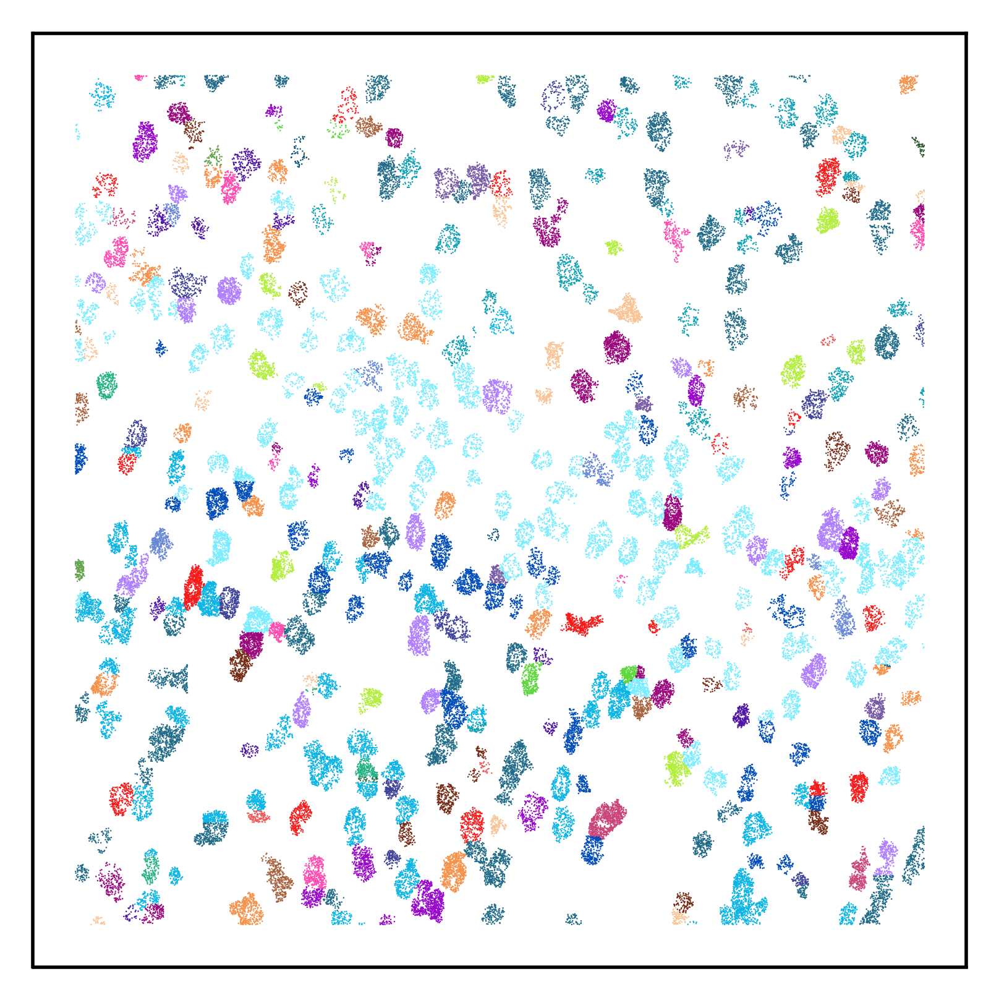

In [67]:
# Plot cut-out
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_assigned[(barcodes_assigned.Centroid_X>px2) & (barcodes_assigned.Centroid_X<px2+500) & (barcodes_assigned.Centroid_Y>py2) & (barcodes_assigned.Centroid_Y<py2+500)] 

plt.scatter(cut_out_df.Centroid_X, cut_out_df.Centroid_Y, c=[cluster_colors[ct] for ct in cut_out_df.osmFISH_ct.values], s=0.5,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig3g.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

In [111]:
# Normalize dataframes
dots_in_cells = dots_in_cells.divide(dots_in_cells.sum(axis=0), axis=1) * dots_in_cells.shape[1] #Corrected for the total per cell
dots_in_cells = dots_in_cells.divide(dots_in_cells.sum(axis=1), axis=0) * dots_in_cells.shape[0] #Corrected for total molecules per gene
# Replace NA and Nan with zero:
dots_in_cells = dots_in_cells.fillna(0)

In [112]:
reorder_rows = dict(zip(cluster_sort,np.arange(dots_in_cells.shape[1])))
go_sort = dots_in_cells.reindex(cluster_sort, axis=1).idxmax(axis=1).map(reorder_rows).argsort().values+1

In [113]:
dots_in_cells = dots_in_cells.reindex(go_sort)
dots_in_cells.columns = [osmfish_ct[x] for x in dots_in_cells.columns]

df used for plot: dots_in_cells
Order of clusters: [18, 17, 14, 19, 15, 16, 20, 9, 8, 10, 6, 5, 4, 12, 1, 13, 3, 2, 32, 33, 30, 22, 21, 28, 29, 24, 27, 31, 7, 26, 25]


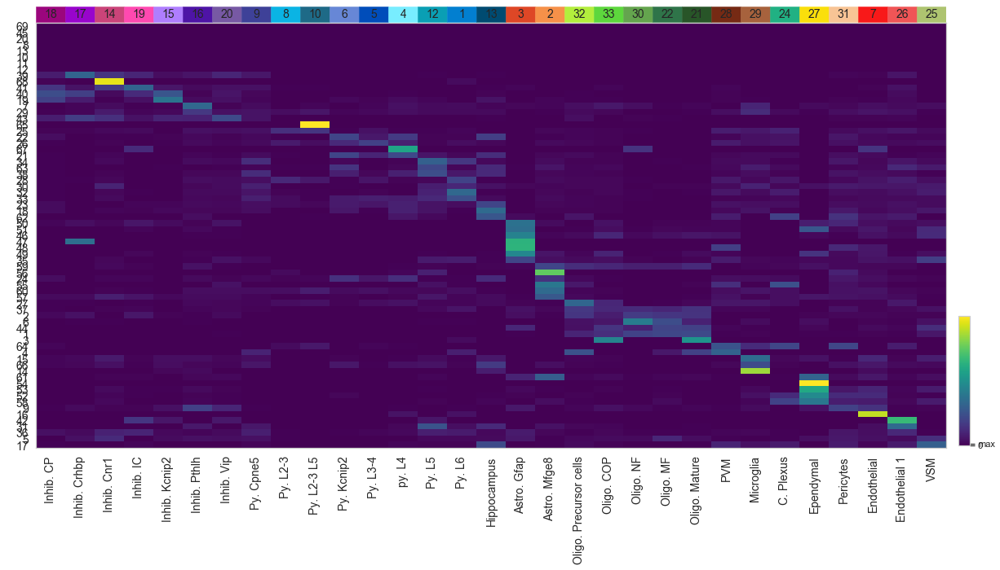

In [115]:
# Plot heatmap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from collections import Counter
heat_map(dots_in_cells, ct_clusters, cluster_colors=cluster_colors, 
         cluster_number=True, sort = cluster_sort, save=True, name='Fig3c', fontsz=14)